In [ ]:
import matplotlib.pyplot as plt
from extract import HIPTFeatureExtractor, WSI_DIR

slide_path = sorted(list((WSI_DIR / 'maxima').iterdir()))[0]
fe = HIPTFeatureExtractor(slide_path)
fe.setup()

In [2]:
next(fe.model.model4k.parameters()).device

AttributeError: 'VisionTransformer' object has no attribute 'model4k'

In [21]:
import torch.nn as nn
from einops import rearrange, repeat

x = fe.dataset[5]

x = x.unsqueeze(0)
batch_256, w_256, h_256 = fe.model.prepare_img_tensor(x)
batch_256 = batch_256.unfold(2, 256, 256).unfold(3, 256, 256)
batch_256 = rearrange(batch_256, 'b c p1 p2 w h -> (b p1 p2) c w h')
# batch_256 = batch_256.to(fe.model.device256, non_blocking=True)
features_cls256 = fe.model.model256(batch_256)

attention_256 = fe.model.model256.get_last_selfattention(batch_256)
nh = attention_256.shape[1] # number of head
attention_256 = attention_256[:, :, 0, 1:].reshape(256, nh, -1)
attention_256 = attention_256.reshape(w_256*h_256, nh, 16, 16)
attention_256 = nn.functional.interpolate(attention_256, scale_factor=16, mode="nearest").cpu().numpy()

features_grid256 = features_cls256.reshape(w_256, h_256, 384).transpose(0,1).transpose(0,2).unsqueeze(dim=0)
features_grid256 = features_grid256.to(fe.model.device4k, non_blocking=True)
features_cls4k = fe.model.model4k.forward(features_grid256).detach().cpu()

attention_4k = fe.model.model4k.get_last_selfattention(features_grid256)
nh = attention_4k.shape[1] # number of head
attention_4k = attention_4k[0, :, 0, 1:].reshape(nh, -1)
attention_4k = attention_4k.reshape(nh, w_256, h_256)
attention_4k = nn.functional.interpolate(attention_4k.unsqueeze(0), scale_factor=256, mode="nearest")[0].cpu().numpy()

# plt.imshow(x.numpy().transpose(1,2,0))
# plt.show()


In [27]:
attention_256.shape

(256, 6, 256, 256)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


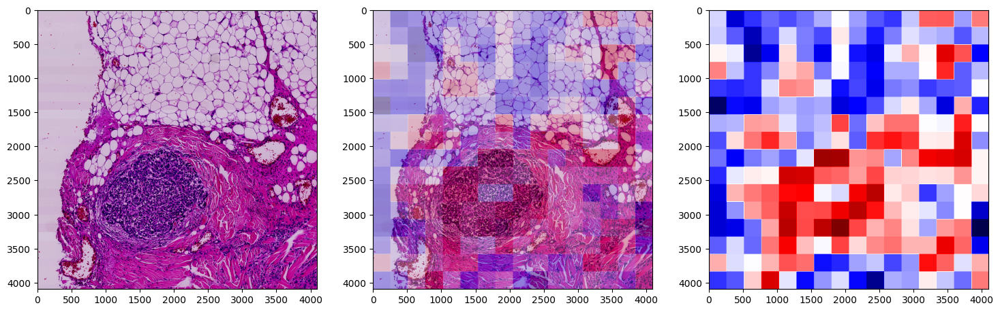

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


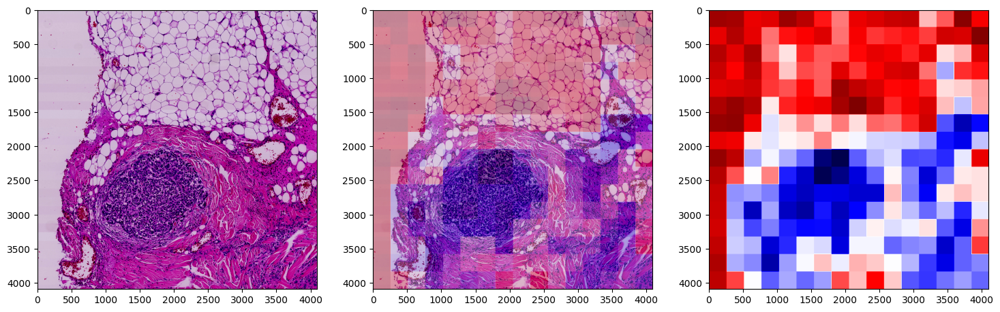

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


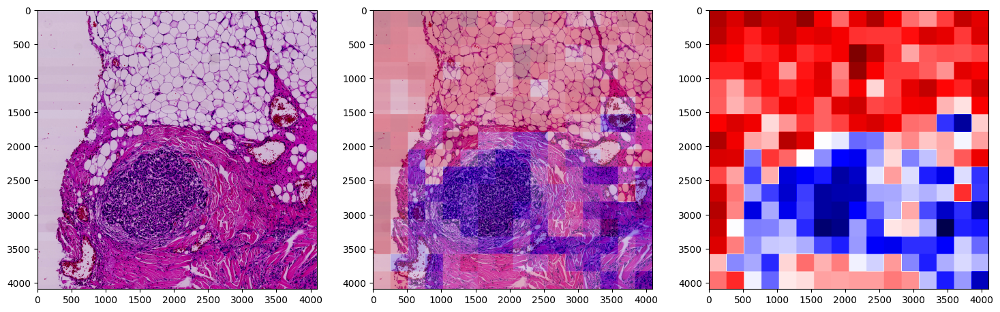

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


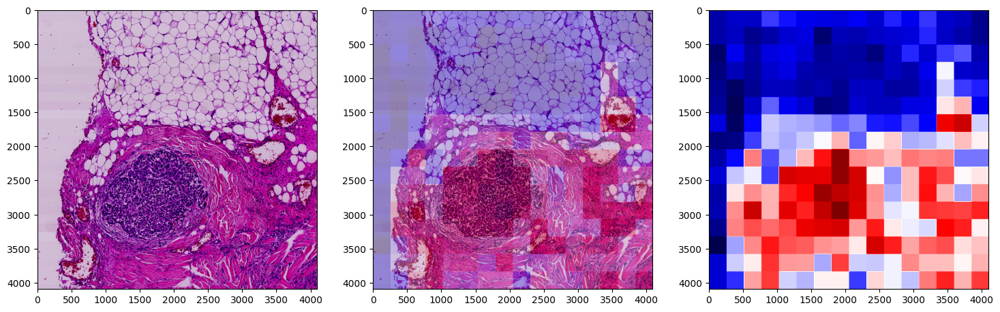

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


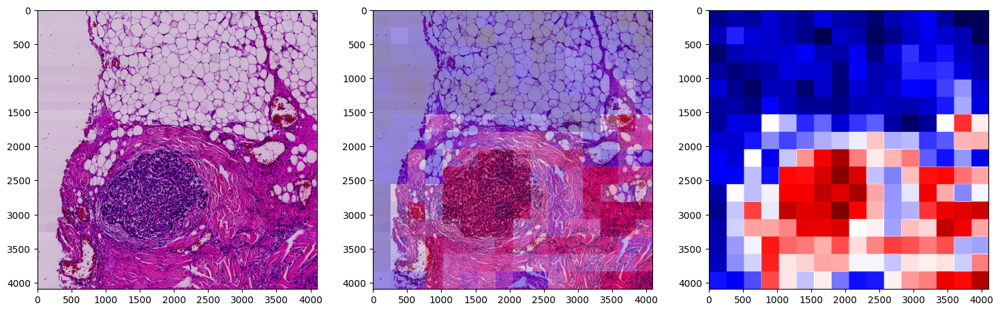

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


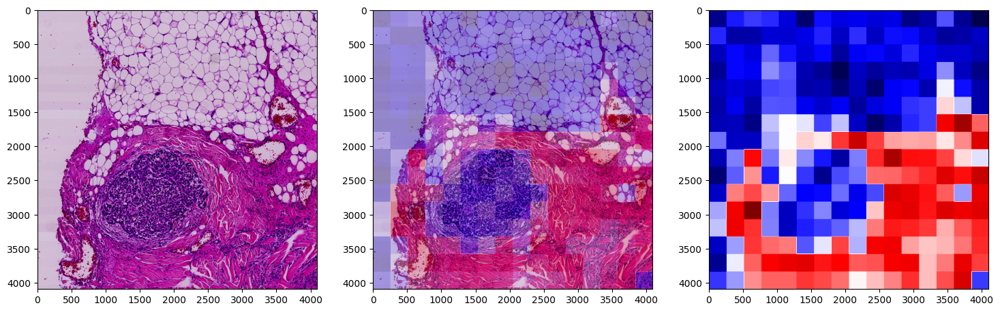

In [26]:
for head in range(6):
    fig, ax = plt.subplots(1,3, figsize=(18,6))
    ax[0].imshow(x[0].numpy().transpose(1,2,0))
    ax[1].imshow(x[0].numpy().transpose(1,2,0))
    ax[1].imshow(attention_4k[head], cmap='seismic', alpha=0.3)
    ax[2].imshow(attention_4k[head], cmap='seismic')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


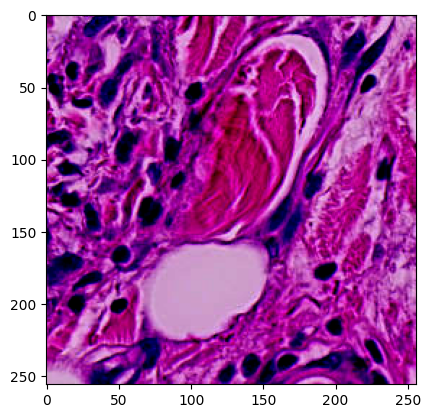

In [9]:
w = 2300
h = 3000

x256 = x[:,h:h+256,w:w+256]
plt.imshow(x256.numpy().transpose(1,2,0))
plt.show()

In [10]:
fe.model.model256.to('cpu')
out = fe.model.model256(x256.unsqueeze(0))

In [11]:
import torch.nn as nn

attention_256 = fe.model.model256.get_last_selfattention(x256.unsqueeze(0))
nh = attention_256.shape[1] # number of head
attention_256 = attention_256[:, :, 0, 1:].reshape(256, nh, -1)
attention_256 = attention_256.reshape(1, nh, 16, 16)
attention_256 = nn.functional.interpolate(attention_256, scale_factor=int(16), mode="nearest").cpu().numpy()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


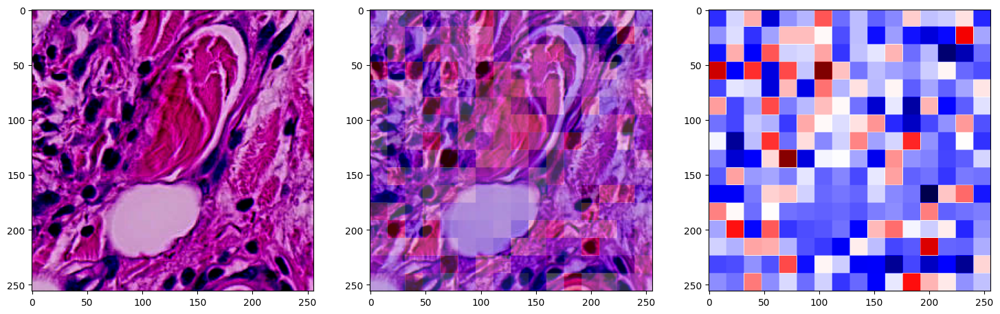

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


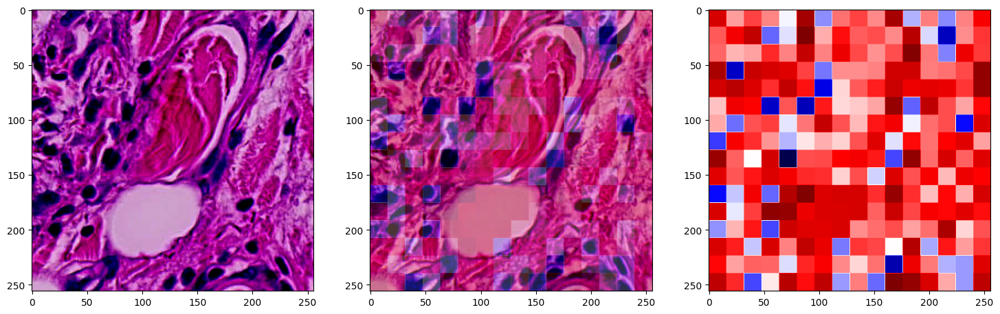

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


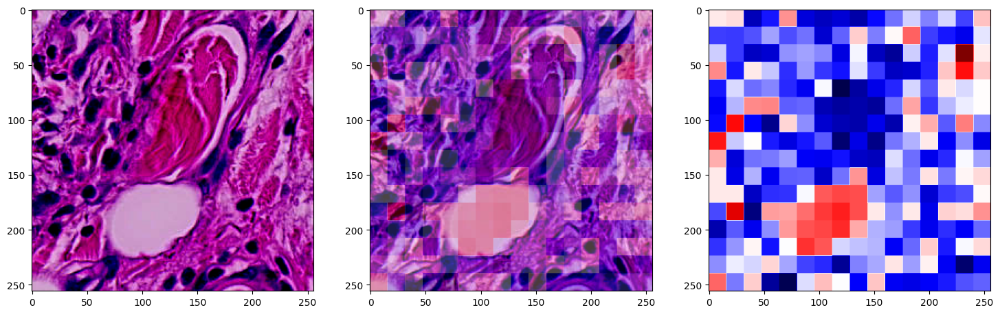

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


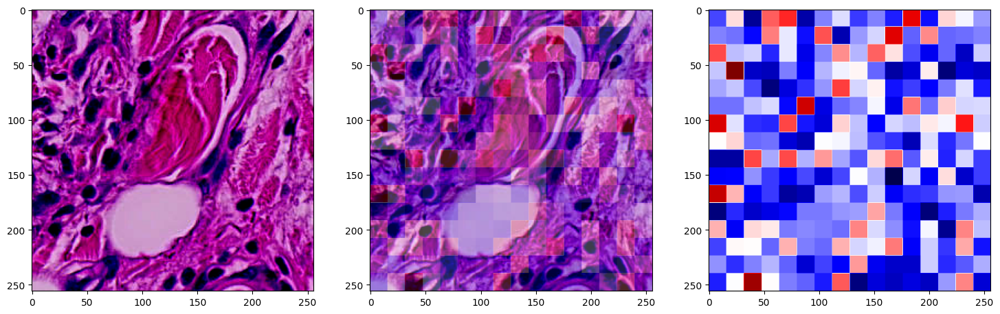

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


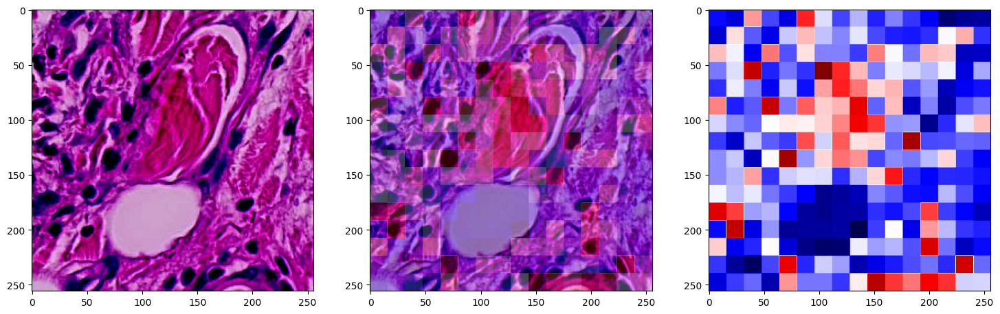

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


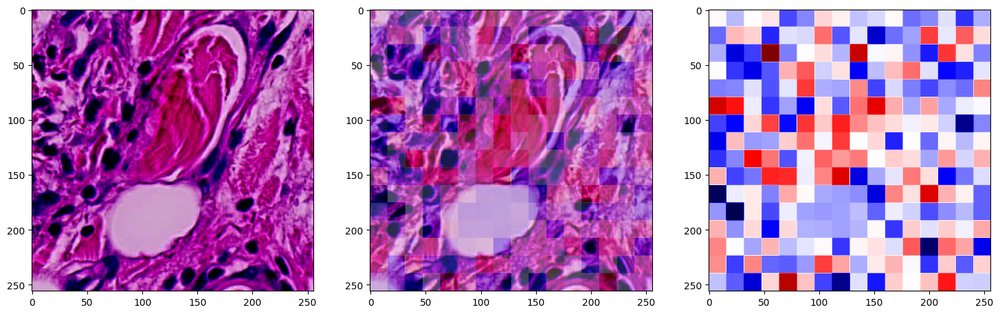

In [15]:

for head in range(6):

    fig, ax = plt.subplots(1,3, figsize=(18,6))
    ax[0].imshow(x256.numpy().transpose(1,2,0))
    ax[1].imshow(x256.numpy().transpose(1,2,0))
    ax[1].imshow(attention_256[0,head], cmap='seismic', alpha=0.3)
    ax[2].imshow(attention_256[0,head], cmap='seismic')
    plt.show()